In [3]:
import pandas as pd
import numpy as np
from collections import Counter, defaultdict

In [4]:
df = pd.read_csv("df_w_embeddings_cluster.csv")

In [3]:
df

,Unnamed: 0,id,text,url,type,postbody,score,created,subreddit,embeddings,cluster
0,0,te6n1q,List of various Charities and Causes,https://www.reddit.com/r/UkraineConflict/comme...,post,&#x200B;\n\n|CHARITIES|LINKS|\n|:-|:-|\n| Offi...,119,1.647289e+09,Ukraine Conflict,"[0.010105731897056103, -0.016673440113663673, ...",5
1,1,i8v0hou,Hello. I am from Ukraine. I am sure that you k...,NaN,comment,NaN,3,1.652731e+09,Ukraine Conflict,"[-0.005754802376031876, -0.010023199021816254,...",1
2,2,i15il3l,"Hi there, \n\n\nThank you for adding us as on...",NaN,comment,NaN,2,1.647612e+09,Ukraine Conflict,"[0.011085981503129005, -0.01079284306615591, -...",1
3,3,i1jafyk,Is It Really Harassments ?! Russian Soldier Go...,NaN,comment,NaN,2,1.647874e+09,Ukraine Conflict,"[-0.01273363083600998, 0.0015917038545012474, ...",6
4,4,i1uq5d6,Many did not see it but the ukraine gov crypto...,NaN,comment,NaN,2,1.648073e+09,Ukraine Conflict,"[-0.012341204099357128, -0.018610075116157532,...",1
...,...,...,...,...,...,...,...,...,...,...,...
24255,24255,jhrx3x3,Only way UA is getting F16s is if the United S...,NaN,comment,NaN,10,1.682511e+09,Ukraine Russia Report,"[-0.009531148709356785, -0.018186921253800392,...",2
24256,24256,jhs6zv8,I mean yeah haven't they been ruled out comple...,NaN,comment,NaN,2,1.682516e+09,Ukraine Russia Report,"[0.005156835541129112, -0.009938628412783146, ...",4
24257,24257,jhrq9fh,"I mean, they never get shit until 3-6 months o...",NaN,comment,NaN,3,1.682507e+09,Ukraine Russia Report,"[-0.008658709935843945, -0.024066969752311707,...",5
24258,24258,jhtkxfz,They will never get it lol.,NaN,comment,NaN,1,1.682536e+09,Ukraine Russia Report,"[-0.0071046724915504456, -0.017819704487919807...",4


In [8]:
topic_1 = df[df["cluster"]==1]

In [5]:
topic_1

,Unnamed: 0,id,text,url,type,postbody,score,created,subreddit,embeddings,cluster
1,1,i8v0hou,Hello. I am from Ukraine. I am sure that you k...,NaN,comment,NaN,3,1.652731e+09,Ukraine Conflict,"[-0.005754802376031876, -0.010023199021816254,...",1
2,2,i15il3l,"Hi there, \n\n\nThank you for adding us as on...",NaN,comment,NaN,2,1.647612e+09,Ukraine Conflict,"[0.011085981503129005, -0.01079284306615591, -...",1
4,4,i1uq5d6,Many did not see it but the ukraine gov crypto...,NaN,comment,NaN,2,1.648073e+09,Ukraine Conflict,"[-0.012341204099357128, -0.018610075116157532,...",1
6,6,i3vakhq,Two important ones were left off this list:\n\...,NaN,comment,NaN,2,1.649400e+09,Ukraine Conflict,"[-0.01571280136704445, -0.016754908487200737, ...",1
7,7,i75hawp,Can you please add this NFT charity project as...,NaN,comment,NaN,2,1.651581e+09,Ukraine Conflict,"[0.005528679583221674, -0.023745357990264893, ...",1
...,...,...,...,...,...,...,...,...,...,...,...
24220,24220,jhs1tx6,"""holding positions"" means running away and sur...",NaN,comment,NaN,-5,1.682514e+09,Ukraine Russia Report,"[-0.035851214081048965, -0.009412648156285286,...",1
24221,24221,jhz9jvh,Tired but never defeated \nSlava Ukraine,NaN,comment,NaN,1,1.682634e+09,Ukraine Russia Report,"[-0.016320686787366867, -0.009178722277283669,...",1
24231,24231,jhs4ncx,"""Ukraine is our brotherly nation, also we want...",NaN,comment,NaN,2,1.682515e+09,Ukraine Russia Report,"[0.0010311140213161707, -0.03253128379583359, ...",1
24232,24232,jhs621z,If anyone here actually believes that America ...,NaN,comment,NaN,2,1.682516e+09,Ukraine Russia Report,"[-0.008800256997346878, -0.019743410870432854,...",1


In [6]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
import nltk

In [9]:
#to tokenize a column of a dataframe and return dataframe with tokenized column!

def tokenize(dataset, column):
    from nltk.stem import WordNetLemmatizer 
    import re 
    lemmatizer = WordNetLemmatizer()
    tokenized_sentences = []
    for comment in dataset[column]:
        comment = re.sub("[^-9A-Za-z ]", "" , comment)
        comment = re.sub(r'https?:\/\/?[a-z0-9]+\.[a-z0-9\/]+', 'URL', comment)
        comment = comment.lower()
        tokens = nltk.word_tokenize(comment)
        for word in comment:
            word = lemmatizer.lemmatize(word) 
        
        tokens = " ".join(tokens)
        tokenized_sentences.append(tokens)
    dataset[column] = tokenized_sentences



In [21]:
#to tokenize a column of a dataframe and return dataframe with tokenized column!

def tokenize(dataset, column):
    from nltk.stem import WordNetLemmatizer 
    import re 
    lemmatizer = WordNetLemmatizer()
    tokenized_sentences = " "
    for comment in dataset[column]:
        comment = re.sub("[^-9A-Za-z ]", "" , comment)
        comment = re.sub(r'https?:\/\/?[a-z0-9]+\.[a-z0-9\/]+', 'URL', comment)
        comment = comment.lower()
        tokens = nltk.word_tokenize(comment)
        for word in comment:
            word = lemmatizer.lemmatize(word) 
        
        tokens = " ".join(tokens)
        tokenized_sentences += tokens
    dataset[column] = tokenized_sentences



In [22]:
tokenize(topic_1, "text")

In [25]:
topic_1.head()

,Unnamed: 0.1,Unnamed: 0,id,text,url,type,postbody,score,created,subreddit,embeddings,cluster
0,1,1,i8v0hou,hello ukraine sure know situation country thi...,NaN,comment,NaN,3,1.652731e+09,Ukraine Conflict,"[-0.005754802376031876, -0.010023199021816254,...",1
1,2,2,i15il3l,hello ukraine sure know situation country thi...,NaN,comment,NaN,2,1.647612e+09,Ukraine Conflict,"[0.011085981503129005, -0.01079284306615591, -...",1
2,4,4,i1uq5d6,hello ukraine sure know situation country thi...,NaN,comment,NaN,2,1.648073e+09,Ukraine Conflict,"[-0.012341204099357128, -0.018610075116157532,...",1
3,6,6,i3vakhq,hello ukraine sure know situation country thi...,NaN,comment,NaN,2,1.649400e+09,Ukraine Conflict,"[-0.01571280136704445, -0.016754908487200737, ...",1
4,7,7,i75hawp,hello ukraine sure know situation country thi...,NaN,comment,NaN,2,1.651581e+09,Ukraine Conflict,"[0.005528679583221674, -0.023745357990264893, ...",1


In [28]:
tokenized_sentences

NameError: name 'tokenized_sentences' is not defined

In [32]:
topic_1.to_csv("topic_1_tokenized.csv")

In [4]:
topic_1= pd.read_csv("topic_1_tokenized.csv")


In [11]:
from nltk.corpus import stopwords

def remove_stopwords(dataset, column):
    stop_words = set(stopwords.words('english')) 
    sentences=[] 
    for comment in topic_1["text"]:
        sentence=[] 
        comment = nltk.word_tokenize(comment)
        for word in comment:
            if word not in stop_words:
                sentence.append(word)
        sentences.append(sentence)
    dataset[column] = sentences
    

In [26]:
from nltk.corpus import stopwords

def remove_stopwords(dataset, column):
    stop_words = set(stopwords.words('english')) 
    sentences= " "
    for comment in topic_1["text"]:
        sentence= " "
        comment = nltk.word_tokenize(comment)
        for word in comment:
            if word not in stop_words:
                sentence += word
        sentences += sentence
    dataset[column] = sentences
    

In [28]:
topic_1["text"].dtype


dtype('O')

In [20]:
sentences

NameError: name 'sentences' is not defined

In [7]:
import nltk

In [29]:
remove_stopwords(topic_1, "text")

KeyboardInterrupt: 

In [14]:
topic_1.to_csv("topic_1_tokenized_no_stopwords.csv")

***BEGINNING OF TOPICMODELING***

In [15]:
topic_1= pd.read_csv("topic_1_tokenized_no_stopwords.csv")

In [19]:
topic_1["text"]

0       ['hello', 'ukraine', 'sure', 'know', 'situatio...
1       ['hi', 'thank', 'adding', 'us', 'one', 'donati...
2       ['many', 'see', 'ukraine', 'gov', 'crypto', 'd...
3       ['two', 'important', 'ones', 'left', 'list', '...
4       ['please', 'add', 'nft', 'charity', 'project',...
                              ...                        
2755    ['holding', 'positions', 'means', 'running', '...
2756    ['tired', 'never', 'defeated', 'slava', 'ukrai...
2757    ['ukraine', 'brotherly', 'nation', 'also', 'wa...
2758    ['anyone', 'actually', 'believes', 'america', ...
2759    ['know', 'tell', 'country', 'claims', 'theyre'...
Name: text, Length: 2760, dtype: object

In [16]:
for comment in topic_1["text"]:
    print(comment)

['hello', 'ukraine', 'sure', 'know', 'situation', 'country', 'things', 'happening', 'right', 'many', 'people', 'giving', 'infinitely', 'valuable', 'help', 'ukrainian', 'refugees', 'donating', 'uaf', 'simply', 'helping', 'spread', 'truth', 'ukraine', 'ukrainians', 'personally', 'appreciate', 'help', 'highly', 'thank', 'heartilybut', 'ask', 'reddit', 'community', 'help', 'safe', 'place', 'ukraine', 'right', 'everywhere', 'might', 'get', 'killed', 'missile', 'strike', 'holding', 'ioi', 'international', 'olympiad', 'informatics', 'selections', 'obviously', 'impossible', 'dear', 'friends', 'poland', 'decided', 'help', 'us', 'organise', 'everything', 'us', 'need', 'money', 'click', 'donate', 'httpszrzutkaplenvpdbmukrainian', 'competitive', 'programmers', 'one', 'powerful', 'cp-eps', 'world', 'recent', 'achievements', 'baltic', 'olympiad', 'informatics', 'gold', 'medals', 'bronze', 'medals', 'international', 'zhautyk', 'olympiad', 'gold', 'medals', 'silver', 'medals', 'bronze', 'medals', 'rom

In [41]:
pip install WordCloud

     ------------------------------------ 151.4/151.4 kB 695.5 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [50]:
topic_1_["text"]

0       [hello, ukraine, sure, know, situation, countr...
1       [hi, thank, adding, us, one, donation, options...
2       [many, see, ukraine, gov, crypto, donation, we...
3       [two, important, ones, left, list, razomforukr...
4       [please, add, nft, charity, project, well, htt...
                              ...                        
2755    [holding, positions, means, running, away, sur...
2756             [tired, never, defeated, slava, ukraine]
2757    [ukraine, brotherly, nation, also, want, nuke,...
2758    [anyone, actually, believes, america, west, wo...
2759    [know, tell, country, claims, theyre, winning,...
Name: text, Length: 2760, dtype: object

In [53]:
words = " "
for comment in topic_1["text"]:
    for word in comment:
        words += word + " " 

AttributeError: 'Series' object has no attribute 'split'

In [51]:
words

" ['hello', 'ukraine', 'sure', 'know', 'situation', 'country', 'things', 'happening', 'right', 'many', 'people', 'giving', 'infinitely', 'valuable', 'help', 'ukrainian', 'refugees', 'donating', 'uaf', 'simply', 'helping', 'spread', 'truth', 'ukraine', 'ukrainians', 'personally', 'appreciate', 'help', 'highly', 'thank', 'heartilybut', 'ask', 'reddit', 'community', 'help', 'safe', 'place', 'ukraine', 'right', 'everywhere', 'might', 'get', 'killed', 'missile', 'strike', 'holding', 'ioi', 'international', 'olympiad', 'informatics', 'selections', 'obviously', 'impossible', 'dear', 'friends', 'poland', 'decided', 'help', 'us', 'organise', 'everything', 'us', 'need', 'money', 'click', 'donate', 'httpszrzutkaplenvpdbmukrainian', 'competitive', 'programmers', 'one', 'powerful', 'cp-eps', 'world', 'recent', 'achievements', 'baltic', 'olympiad', 'informatics', 'gold', 'medals', 'bronze', 'medals', 'international', 'zhautyk', 'olympiad', 'gold', 'medals', 'silver', 'medals', 'bronze', 'medals', 'r

In [52]:
for word in words:
    print(word)

 
[
'
h
e
l
l
o
'
,
 
'
u
k
r
a
i
n
e
'
,
 
'
s
u
r
e
'
,
 
'
k
n
o
w
'
,
 
'
s
i
t
u
a
t
i
o
n
'
,
 
'
c
o
u
n
t
r
y
'
,
 
'
t
h
i
n
g
s
'
,
 
'
h
a
p
p
e
n
i
n
g
'
,
 
'
r
i
g
h
t
'
,
 
'
m
a
n
y
'
,
 
'
p
e
o
p
l
e
'
,
 
'
g
i
v
i
n
g
'
,
 
'
i
n
f
i
n
i
t
e
l
y
'
,
 
'
v
a
l
u
a
b
l
e
'
,
 
'
h
e
l
p
'
,
 
'
u
k
r
a
i
n
i
a
n
'
,
 
'
r
e
f
u
g
e
e
s
'
,
 
'
d
o
n
a
t
i
n
g
'
,
 
'
u
a
f
'
,
 
'
s
i
m
p
l
y
'
,
 
'
h
e
l
p
i
n
g
'
,
 
'
s
p
r
e
a
d
'
,
 
'
t
r
u
t
h
'
,
 
'
u
k
r
a
i
n
e
'
,
 
'
u
k
r
a
i
n
i
a
n
s
'
,
 
'
p
e
r
s
o
n
a
l
l
y
'
,
 
'
a
p
p
r
e
c
i
a
t
e
'
,
 
'
h
e
l
p
'
,
 
'
h
i
g
h
l
y
'
,
 
'
t
h
a
n
k
'
,
 
'
h
e
a
r
t
i
l
y
b
u
t
'
,
 
'
a
s
k
'
,
 
'
r
e
d
d
i
t
'
,
 
'
c
o
m
m
u
n
i
t
y
'
,
 
'
h
e
l
p
'
,
 
'
s
a
f
e
'
,
 
'
p
l
a
c
e
'
,
 
'
u
k
r
a
i
n
e
'
,
 
'
r
i
g
h
t
'
,
 
'
e
v
e
r
y
w
h
e
r
e
'
,
 
'
m
i
g
h
t
'
,
 
'
g
e
t
'
,
 
'
k
i
l
l
e
d
'
,
 
'
m
i
s
s
i
l
e
'
,
 
'
s
t
r
i
k
e
'
,
 
'
h
o
l
d
i
n
g
'
,
 
'
i
o
i
'
,
 
'
i
n
t
e
r
n
a
t
i
o


In [26]:
from wordcloud import WordCloud

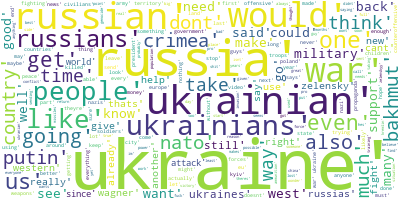

In [47]:
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
wordcloud.generate(words)
wordcloud.to_image()

In [31]:
df_ = pd.read_csv("df_w_embeddings_cluster")

df = df_[df_["cluster"]==1]

In [40]:
scoredf = df.sort_values(by=["score"], ascending= False)

In [41]:
for post in scoredf["text"][:200]:
    print(post)

US approves another US$1.25 billion grant to Ukraine
PACE recognises deportation of Ukrainian children to Russia as genocide
US Ambassador: 'Hungary's policy of standing alone to block high level meetings of NATO-Ukraine Committee untenable'
Putin signs into law decision to deport Ukrainians without Russian passports from Russian-occupied Ukrainian territories
Following the invasion of Ukraine, majority of the world disapproves of Russia's leadership for the first time: new poll
Ukraine says it's wrapping up preparations for counteroffensive
Ukraine prepares priority action plan for liberated Crimea – President's representative in Crimea
>Pavel, a former general and senior NATO leader, was unequivocal. 

>When it comes to Ukraine, he argued, China only wants what’s best for itself — and, for now, that’s more war.
Medvedev wants a “peaceful division” of Ukraine with Romania, Hungary and Poland to avoid another world war
Budapest to Zelenskyy: Hungarian people paid high price for this wa

In [48]:
word_frequencies = Counter()
for sentence in topic_1["text"]:
    for word in sentence.split():
        word_frequencies[word] += 1

In [49]:
word_frequencies

Counter({"'ukraine',": 1647,
         "'russia',": 748,
         "'ukrainian',": 599,
         "'russian',": 551,
         "'war',": 464,
         "'like',": 363,
         "'would',": 336,
         "'ukrainians',": 298,
         "'people',": 292,
         "'ukraine']": 250,
         "'one',": 219,
         "'russians',": 218,
         "'us',": 212,
         "'dont',": 207,
         "'military',": 202,
         "'even',": 197,
         "'get',": 196,
         "'going',": 183,
         "'-',": 181,
         "'also',": 180,
         "'could',": 165,
         "'see',": 155,
         "['ukraine',": 153,
         "'nato',": 153,
         "'support',": 150,
         "'crimea',": 148,
         "'take',": 145,
         "'back',": 145,
         "'country',": 143,
         "'want',": 142,
         "'bakhmut',": 140,
         "'make',": 138,
         "'time',": 136,
         "'putin',": 136,
         "'forces',": 134,
         "'much',": 131,
         "'way',": 130,
         "'need',": 129,
      

In [1]:
word_frequencies.findindex('ukraine')

NameError: name 'word_frequencies' is not defined

In [48]:
pip install yellowbrick


     -------------------------------------- 282.6/282.6 kB 8.8 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


c:\Users\vomit\OneDrive\Desktop\THESIS\thesis\Lib\site-packages\yellowbrick\text\tsne.py:401: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  self.ax.scatter(


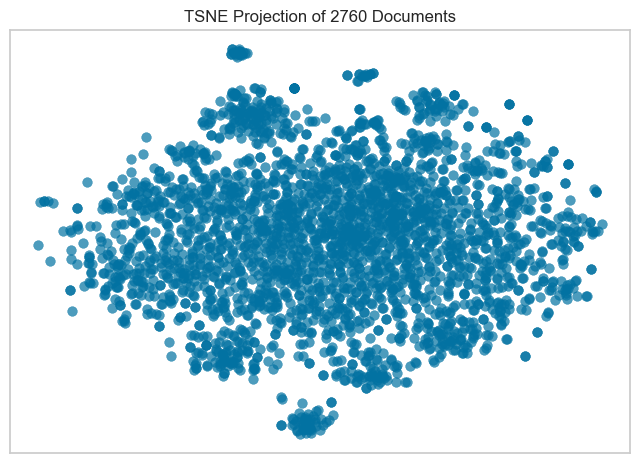

<Axes: title={'center': 'TSNE Projection of 2760 Documents'}>

In [49]:
from yellowbrick.text import TSNEVisualizer
from sklearn.feature_extraction.text import TfidfVectorizer

# vectorize the text
tfidf  = TfidfVectorizer()
tuple_vectors = tfidf.fit_transform(df["text"])

# Create the visualizer and draw the vectors
tsne = TSNEVisualizer()
tsne.fit(tuple_vectors)
tsne.poof()

In [52]:
df = df_[df_["cluster"]==1]
df = df[df["type"]== "post"]
scoredf = df.sort_values(by=["score"], ascending= False)
i =1
while i<100:
    print(scoredf["text"].iloc[i], "\nSUBRED:", scoredf["subreddit"].iloc[i], "LINK:", scoredf["url"].iloc[i])
    i+=1

PACE recognises deportation of Ukrainian children to Russia as genocide 
SUBRED: World News LINK: https://www.pravda.com.ua/eng/news/2023/04/27/7399739/
US Ambassador: 'Hungary's policy of standing alone to block high level meetings of NATO-Ukraine Committee untenable' 
SUBRED: World News LINK: https://telex.hu/english/2023/04/26/us-ambassador-hungarys-policy-of-standing-alone-to-block-high-level-meetings-of-nato-ukraine-committee-untenable
Putin signs into law decision to deport Ukrainians without Russian passports from Russian-occupied Ukrainian territories 
SUBRED: World News LINK: https://www.yahoo.com/entertainment/putin-signs-law-decision-deport-202813408.html
Following the invasion of Ukraine, majority of the world disapproves of Russia's leadership for the first time: new poll 
SUBRED: World News LINK: https://www.msn.com/en-us/news/world/following-the-invasion-of-ukraine-majority-of-the-world-disapproves-of-russia-s-leadership-for-the-first-time-new-poll/ar-AA1al0vN?ocid=windi

In [32]:
df = df_[df_["cluster"]==1]
df = df[df["type"]== "comment"]
scoredf = df.sort_values(by=["score"], ascending= False)
i =1
while i<100:
    print(scoredf["text"].iloc[i], "\nSUBRED:", scoredf["subreddit"].iloc[i], "LINK:", scoredf["url"].iloc[i])
    i+=1

To me, this means the US absolutely believes that fucker is truly capable of using a nuke in Ukraine, and is trying to prevent it from being deniable. 
SUBRED: World News LINK: nan
> Russian pensioners are being tricked into tossing Molotov cocktails at Russian military offices and officials' cars, according to local media outlets.
> 
> Since the war in Ukraine began, Russian citizens have carried out at least 16 separate arson attempts on government or bank properties at the behest of scammers, reported the **independent** Russian media outlet, [MediaZona.](https://en.zona.media/)
> 
> The people involved have tried to set fire to enlistment offices, bank ATMs, a car trunk, and a police department, though most have been unsuccessful, the outlet reported. At least 11 of them were over 55, per MediaZona.
> 
> Some of them, like the 65-year-old Yelena Belova, were told to shout pro-Ukrainian slogans as they chucked the Molotov cocktails — even though they were also told they were helping

In [5]:
import pandas as pd
df_ = pd.read_csv("df_w_embeddings_cluster.csv")
topic = df_[df_["cluster"]==1]
topic["topic"] = "Ukraine Foreign Relations"
topic.to_csv("topic_1_labeled_originaltext.csv")


C:\Users\vomit\AppData\Local\Temp\ipykernel_29672\126714098.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  topic["topic"] = "Ukraine Foreign Relations"


In [3]:
topic

,Unnamed: 0,id,text,url,type,postbody,score,created,subreddit,embeddings,cluster,topic
1,1,i8v0hou,Hello. I am from Ukraine. I am sure that you k...,NaN,comment,NaN,3,1.652731e+09,Ukraine Conflict,"[-0.005754802376031876, -0.010023199021816254,...",1,Ukraine Foreign Relations
2,2,i15il3l,"Hi there, \n\n\nThank you for adding us as on...",NaN,comment,NaN,2,1.647612e+09,Ukraine Conflict,"[0.011085981503129005, -0.01079284306615591, -...",1,Ukraine Foreign Relations
4,4,i1uq5d6,Many did not see it but the ukraine gov crypto...,NaN,comment,NaN,2,1.648073e+09,Ukraine Conflict,"[-0.012341204099357128, -0.018610075116157532,...",1,Ukraine Foreign Relations
6,6,i3vakhq,Two important ones were left off this list:\n\...,NaN,comment,NaN,2,1.649400e+09,Ukraine Conflict,"[-0.01571280136704445, -0.016754908487200737, ...",1,Ukraine Foreign Relations
7,7,i75hawp,Can you please add this NFT charity project as...,NaN,comment,NaN,2,1.651581e+09,Ukraine Conflict,"[0.005528679583221674, -0.023745357990264893, ...",1,Ukraine Foreign Relations
...,...,...,...,...,...,...,...,...,...,...,...,...
24220,24220,jhs1tx6,"""holding positions"" means running away and sur...",NaN,comment,NaN,-5,1.682514e+09,Ukraine Russia Report,"[-0.035851214081048965, -0.009412648156285286,...",1,Ukraine Foreign Relations
24221,24221,jhz9jvh,Tired but never defeated \nSlava Ukraine,NaN,comment,NaN,1,1.682634e+09,Ukraine Russia Report,"[-0.016320686787366867, -0.009178722277283669,...",1,Ukraine Foreign Relations
24231,24231,jhs4ncx,"""Ukraine is our brotherly nation, also we want...",NaN,comment,NaN,2,1.682515e+09,Ukraine Russia Report,"[0.0010311140213161707, -0.03253128379583359, ...",1,Ukraine Foreign Relations
24232,24232,jhs621z,If anyone here actually believes that America ...,NaN,comment,NaN,2,1.682516e+09,Ukraine Russia Report,"[-0.008800256997346878, -0.019743410870432854,...",1,Ukraine Foreign Relations
